# Create crops of 557 x 367 pixels for both images and masks

In [1]:
from PIL import Image
import os

import numpy as np

In [78]:

imagepath = '../ddsm_raws_new/2class/'
maskpath = '../ddsm_masks/2class/'



img_list = os.listdir(imagepath)
mask_list = os.listdir(maskpath)

mask_list.remove('.ipynb_checkpoints')

In [81]:
mysizelist = []
for image_name in img_list:
        
    im = Image.open(os.path.join(imagepath, image_name))
    w, h = im.size
    mysizelist.append((w,h))
print(min(mysizelist))
print(max(mysizelist))    

(1531, 5131)
(5641, 6886)


In [83]:
masksizelist = []
for image_name in mask_list:
        
    im = Image.open(os.path.join(maskpath, image_name))
    w, h = im.size
    masksizelist.append((w,h))
print(min(masksizelist))
print(max(masksizelist))


(1531, 5131)
(5641, 6886)


In [19]:
dataroot = '../bc_images/'
dataroot2 = '../bc_masks/'

In [20]:
def crop(path, root, height,width):
    image_list = os.listdir(path)
    image_list.remove('.ipynb_checkpoints') #this is needed for the masks
    for image_name in image_list:
        
        im = Image.open(os.path.join(path, image_name))
        new = im.resize((4456, 2936)) # width, height
        imgwidth, imgheight = new.size
        #print(imgheight//height)
        #print((imgwidth//width))
        c = 0
        for i in range(imgheight//height):
            for j in range(imgwidth//width):
                box = (j*height, i*width, (j+1)*height, (i+1)*width)
                patch = new.crop(box)
                img=Image.new('RGB', (height,width), 1)
                img.paste(patch)
                path2=os.path.join(root, image_name.split('.png')[0] + '-%s.png' % c)
                img.save(path2)
                c += 1




In [21]:
width=367
height=557
#crop(imagepath, dataroot, height, width)
crop(maskpath, dataroot2, width,height) # for the masks it goes with png ! do not forget!

### 115008 patches in each folder before filtering !

# Find the patches that do not contain masks, erase, and erase the image patches that were pairs with each of these masks.

In [22]:
masklist = []

bc_masks = os.listdir(dataroot2)
#bc_masks.remove('.ipynb_checkpoints')

for idx in range(len(bc_masks)):
    name = bc_masks[idx]
    
    image = Image.open(os.path.join(dataroot2,name))
    extrema = image.convert("L").getextrema()
    
    if extrema[0] == extrema[1]:
        print(name, "This image is one solid color, so I won't use it")
        
        masklist.append(name)
    else:
        # do something with the image img
        pass

cancer_08-A_1415_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1033_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0198_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-C_0104_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I 

cancer_12-D_4053_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3505_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use 

cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won'

cancer_05-C_0200_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0055_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so 

cancer_02-C_0121_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won'

cancer_03-A_1015_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0177_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I 

cancer_15-C_0418_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3065_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0122_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-B_3067_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1056_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won'

cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0083_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_04-A_1100_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1524_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won'

cancer_08-A_1485_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-C_0166_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't

cancer_15-B_3043_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3382_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0048_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I 

cancer_09-B_3107_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0041_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I 

cancer_10-A_1589_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-B_3061_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1579_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I

cancer_02-C_0057_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_14-A_1895_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't us

cancer_12-D_4146_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-B_3411_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_11-A_1576_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I wo

cancer_15-B_3509_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0153_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1557_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-C_0166_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't u

cancer_01-B_3005_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-C_0026_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won

cancer_02-C_0082_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3005_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't us

cancer_01-B_3051_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4093_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-C_0017_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I w

cancer_13-D_4152_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0132_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I wo

cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0037_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-C_0001_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0118_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_10-A_1669_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1721_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_07-A_1245_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won'

cancer_06-A_1203_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0059_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0139_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4147_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1051_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I wo

cancer_11-A_1816_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0154_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3061_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I wo

cancer_12-D_4087_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_07-A_1240_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won

cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-C_0481_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0120_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0168_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won'

cancer_01-B_3065_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1039_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't

cancer_04-A_1102_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1169_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I wo

cancer_08-A_1251_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1635_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't 

cancer_06-A_1164_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1023_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-C_0007_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-B_3378_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I wo

cancer_03-A_1047_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't 

cancer_02-C_0057_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0085_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1037_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_08-A_1466_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0119_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won

cancer_02-C_0038_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I

cancer_05-C_0165_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0067_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4128_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use

cancer_02-C_0118_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3011_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0118_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I 

cancer_13-D_4181_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1417_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won'

cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4183_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't

cancer_09-B_3411_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4160_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I

cancer_06-A_1115_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0052_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won

cancer_14-A_1987_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_11-A_1790_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won'

cancer_01-B_3065_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0182_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-C_0039_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I 

cancer_03-A_1025_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0046_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I

cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1253_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-C_0005_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't u

cancer_03-A_1011_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1466_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_14-A_1895_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4121_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won'

cancer_14-A_1904_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_07-A_1240_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I wo

cancer_03-A_1086_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I w

cancer_06-A_1140_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won

cancer_07-A_1253_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0018_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't 

cancer_05-C_0128_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1138_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I w

cancer_05-C_0213_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0098_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1234_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so 

cancer_10-A_1699_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0149_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1056_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I

cancer_08-A_1467_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0040_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1621_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I w

cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1637_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I w

cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I w

cancer_03-A_1009_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0118_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so 

cancer_09-B_3137_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4122_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1030_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't

cancer_15-B_3513_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4143_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0096_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1107_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_01-B_3023_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I

cancer_04-A_1087_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-C_0195_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I w

cancer_08-A_1416_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1557_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3005_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I wo

cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_13-D_4181_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't 

cancer_12-D_4184_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3010_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won'

cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3090_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1203_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0173_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0198_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4147_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I wo

cancer_01-B_3051_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won'

cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I wo

cancer_06-A_1112_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1253_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use

cancer_07-A_1143_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4111_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0164_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1577_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won'

cancer_02-B_3067_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0112_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so 

cancer_09-B_3035_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't

cancer_07-A_1253_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I w

cancer_08-A_1508_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0040_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1823_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0098_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I 

cancer_02-C_0062_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-C_0116_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0041_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't 

cancer_10-A_1592_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0077_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I wo

cancer_06-A_1181_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't

cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1488_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1695_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I wo

cancer_05-C_0152_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0164_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won'

cancer_09-B_3011_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-B_3413_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won'

cancer_02-C_0096_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1243_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I wo

cancer_10-A_1665_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't

cancer_04-A_1088_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0134_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I 

cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_09-C_0026_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I 

cancer_02-C_0088_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1063_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won

cancer_04-A_1079_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3059_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_11-A_1825_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-B_3405_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won

cancer_04-A_1089_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_14-A_1852_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won

cancer_04-A_1101_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_08-A_1500_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4123_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I w

cancer_06-A_1196_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1825_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I

cancer_05-C_0060_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_11-A_1252_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so 

cancer_06-A_1112_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_01-B_3081_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-B_3067_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so

cancer_03-A_1042_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1668_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0034_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't 

cancer_12-D_4148_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won

cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0122_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I wo

cancer_14-A_1930_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I 

cancer_02-C_0073_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I wo

cancer_05-C_0146_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_05-C_0193_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1852_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_11-A_1721_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't

cancer_01-C_0006_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1109_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1039_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1637_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't

cancer_02-C_0022_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I

cancer_14-A_1983_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-B_3081_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4106_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I 

cancer_05-C_0170_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won

cancer_01-B_3017_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-B_3377_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1823_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0134_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I wo

cancer_09-B_3397_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1665_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I w

cancer_01-C_0015_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0341_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4093_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-C_0481_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I wo

cancer_07-A_1135_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-C_0083_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0088_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4106_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I wo

cancer_15-B_3053_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_14-A_1905_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1490_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1665_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't 

cancer_08-A_1111_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0120_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0080_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1132_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won'

cancer_07-A_1238_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1662_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1577_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I wo

cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3005_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0096_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1581_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't u

cancer_11-A_1663_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-C_0166_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_13-D_4162_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I wo

cancer_07-A_1116_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I 

cancer_09-B_3011_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0085_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won

cancer_14-A_1872_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1017_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0203_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I wo

cancer_09-B_3031_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_04-A_1079_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-C_0104_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1675_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I wo

cancer_08-A_1532_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_13-D_4181_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won

cancer_01-C_0010_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1579_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1252_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won

cancer_03-A_1063_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0173_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I

cancer_06-A_1202_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_11-A_1675_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0123_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0085_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-C_0103_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't

cancer_08-A_1251_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4043_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0132_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won'

cancer_03-A_1019_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-B_3040_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1532_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I 

cancer_05-C_0207_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0168_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't

cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I wo

cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_07-A_1244_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1235_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0119_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-C_0339_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won

cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0203_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_04-A_1079_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I wo

cancer_05-C_0148_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3011_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I 

cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I w

cancer_08-A_1466_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't

cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_15-B_3378_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0150_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't 

cancer_03-A_1009_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1581_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I w

cancer_01-B_3071_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3500_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-B_3048_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4093_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't

cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_07-A_1235_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0047_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0210_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I 

cancer_06-A_1145_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1531_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_11-A_1183_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't us

cancer_06-A_1211_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4129_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I

cancer_11-A_1329_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_14-A_1852_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't 

cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0136_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0122_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I 

cancer_03-A_1002_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0118_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0120_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I w

cancer_07-A_1146_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-B_3011_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won'

cancer_10-A_1595_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4104_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1621_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I w

cancer_12-D_4113_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-B_3391_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't

cancer_11-A_1329_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3068_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1084_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won

cancer_10-A_1570_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_09-C_0166_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I

cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_11-A_1823_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I 

cancer_04-A_1088_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_09-B_3405_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I w

cancer_14-A_1895_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4184_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won'

cancer_07-A_1114_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-C_0229_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I wo

cancer_11-A_1720_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I wo

cancer_12-D_4125_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_08-A_1251_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1249_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_11-A_1695_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won'

cancer_02-C_0037_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4121_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0169_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I 

cancer_12-D_4188_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_06-A_1203_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4106_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I w

cancer_02-C_0052_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0060_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1024_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0040_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won

cancer_15-B_3378_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won

cancer_04-A_1079_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1171_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0229_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3377_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0088_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won'

cancer_10-A_1668_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1627_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won'

cancer_11-A_1820_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't

cancer_09-B_3006_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won'

cancer_06-A_1169_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1399_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't

cancer_01-B_3051_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't

cancer_09-B_3106_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3500_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0210_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I wo

cancer_01-B_3055_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4107_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I w

cancer_10-A_1638_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0142_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1176_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-C_0418_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I w

cancer_15-B_3500_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-C_0229_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0180_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1517_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't u

cancer_14-A_1987_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1030_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I wo

cancer_09-B_3107_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1577_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1230_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3413_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I w

cancer_06-A_1174_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't us

cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0027_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't 

cancer_12-D_4127_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-B_3054_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3137_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1033_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I wo

cancer_09-C_0225_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_03-A_1052_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-C_0224_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_02-C_0037_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I w

cancer_06-A_1203_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0080_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_08-A_1529_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I w

cancer_10-A_1699_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won

cancer_01-B_3042_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_08-A_1485_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0181_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I 

cancer_11-A_1828_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0122_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-C_0418_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won'

cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_11-A_1183_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1517_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1695_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3405_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1176_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won

cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3507_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1652_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I wo

cancer_06-A_1171_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't u

cancer_14-A_1897_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1033_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_09-B_3054_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't

cancer_01-B_3018_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won

cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4121_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4122_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I wo

cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won

cancer_11-A_1727_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3402_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1129_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1056_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so

cancer_06-A_1171_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't

cancer_15-B_3501_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1037_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3377_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I 

cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1817_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4107_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I

cancer_09-B_3379_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0096_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I 

cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1253_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_07-A_1237_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0168_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I w

cancer_04-A_1093_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won'

cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_01-B_3045_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4107_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so 

cancer_08-A_1517_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_08-A_1399_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-C_0457_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4123_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_11-A_1697_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won

cancer_09-B_3382_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_07-A_1160_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4111_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I

cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3382_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0177_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I 

cancer_05-C_0141_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-B_3068_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won

cancer_09-C_0188_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0145_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3378_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won

cancer_02-C_0023_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't 

cancer_08-A_1534_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't 

cancer_09-C_0176_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I wo

cancer_02-C_0098_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4043_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I w

cancer_03-A_1004_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-B_3391_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_12-D_4107_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't 

cancer_05-C_0127_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-B_3402_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0081_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_11-A_1727_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I w

cancer_09-B_3136_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_08-A_1500_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1662_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I wo

cancer_05-C_0177_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1904_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1675_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won'

cancer_02-C_0100_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1051_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_11-A_1729_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0203_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, s

cancer_02-C_0097_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I 

cancer_11-A_1827_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0091_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0077_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0173_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won

cancer_02-C_0111_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-C_0116_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't u

cancer_02-C_0036_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4113_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I 

cancer_08-A_1128_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0037_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1079_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won'

cancer_10-A_1622_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1675_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't 

cancer_10-A_1667_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1001_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won

cancer_15-C_0103_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0147_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_04-A_1001_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't u

cancer_01-C_0011_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_14-A_1895_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_04-A_1076_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I w

cancer_08-A_1558_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0180_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3474_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1637_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won'

cancer_01-B_3033_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1201_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0060_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1399_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0198_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-C_0039_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I w

cancer_09-C_0166_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0179_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1532_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won'

cancer_09-B_3136_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1039_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4123_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3081_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I w

cancer_06-A_1190_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0147_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_01-C_0017_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0118_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I w

cancer_05-C_0172_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3040_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won

cancer_05-C_0180_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1056_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-C_0001_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I 

cancer_11-A_1827_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_06-A_1109_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I wo

cancer_07-A_1213_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't u

cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_14-A_1852_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won

cancer_02-C_0041_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_14-A_1903_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0087_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1234_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0149_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't

cancer_07-A_1237_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4186_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_06-A_1138_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won

cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't u

cancer_03-A_1058_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4173_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1244_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won

cancer_15-B_3050_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1024_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_08-A_1524_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1675_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won'

cancer_11-A_1697_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-B_3392_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1666_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-C_0007_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won

cancer_04-A_1102_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_04-A_1107_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won

cancer_06-A_1155_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_08-A_1399_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1201_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I w

cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-C_0229_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I w

cancer_06-A_1154_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3059_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0142_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4107_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't 

cancer_12-D_4159_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1490_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0048_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won

cancer_02-C_0078_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0206_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1579_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1176_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I wo

cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-B_3391_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1817_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so 

cancer_02-C_0130_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1042_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_11-A_1635_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't

cancer_15-C_0361_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_12-D_4186_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't u

cancer_15-C_0360_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1201_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1024_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I 

cancer_02-C_0077_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_12-D_4183_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I wo

cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4123_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-C_0001_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_10-A_1243_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so

cancer_10-A_1598_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0041_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't 

cancer_01-B_3049_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_11-A_1576_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I 

cancer_01-B_3081_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_11-A_1695_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1636_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-C_0017_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won

cancer_10-A_1626_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1090_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I 

cancer_08-A_1226_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0088_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0169_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so

cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1129_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't

cancer_08-A_1139_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0181_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_09-B_3405_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I 

cancer_12-D_4105_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won'

cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1249_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-C_0104_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0158_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't

cancer_07-A_1114_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I

cancer_05-C_0126_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1237_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I w

cancer_01-B_3001_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3033_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1729_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't u

cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1557_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won'

cancer_02-C_0047_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1595_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4106_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-B_3087_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I wo

cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0203_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won

cancer_02-C_0133_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-C_0229_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0222_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won'

cancer_01-B_3062_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0071_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1635_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't us

cancer_14-A_1898_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0071_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1176_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-B_3402_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1051_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't

cancer_07-A_1232_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_13-D_4162_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1621_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3393_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1249_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I 

cancer_02-C_0130_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0169_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_04-A_1001_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't

cancer_15-B_3135_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0170_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't

cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0180_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4119_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0027_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I wo

cancer_11-A_1730_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_04-A_1079_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0168_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1251_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1721_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't u

cancer_02-C_0099_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I 

cancer_03-A_1014_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-B_3005_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0088_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0147_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I wo

cancer_02-C_0092_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1090_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0145_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0085_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won

cancer_02-C_0138_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1579_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1065_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_11-A_1636_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I wo

cancer_02-C_0035_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-C_0224_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0198_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won

cancer_01-B_3010_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I wo

cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-B_3087_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't 

cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_04-A_1001_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_05-C_0168_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3378_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so

cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't

cancer_06-A_1108_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0132_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1058_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use

cancer_07-A_1257_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_15-B_3048_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0067_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I 

cancer_01-B_3016_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0189_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won

cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-C_0039_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1825_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won

cancer_05-C_0146_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0139_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0027_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I 

cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-B_3054_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won

cancer_04-A_1102_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4193_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1500_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0067_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_13-D_4193_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4113_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't u

cancer_07-A_1261_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won'

cancer_14-A_1849_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0145_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0207_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-C_0195_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won

cancer_06-A_1212_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won'

cancer_12-D_4184_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't 

cancer_15-C_0481_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4190_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0222_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won'

cancer_11-A_1236_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1138_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_08-A_1404_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_11-A_1531_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won'

cancer_10-A_1578_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0116_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1485_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I

cancer_04-A_1010_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won'

cancer_12-D_4056_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I wo

cancer_02-B_3067_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_12-D_4160_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-C_0039_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I wo

cancer_01-B_3005_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-C_0055_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won'

cancer_12-D_4183_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1825_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0164_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0136_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't

cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1243_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_08-A_1485_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1196_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't u

cancer_10-A_1699_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3382_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1577_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't u

cancer_11-A_1635_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0163_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1186_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won

cancer_15-B_3043_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4093_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1037_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3068_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I w

cancer_10-A_1654_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0207_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I 

cancer_02-C_0124_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0139_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4160_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1030_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I wo

cancer_14-A_1848_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1627_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0191_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't u

cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1166_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0120_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I w

cancer_01-B_3013_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0137_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I wo

cancer_09-C_0220_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I w

cancer_15-C_0496_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0166_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won'

cancer_06-A_1162_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0077_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I w

cancer_02-C_0086_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I w

cancer_01-C_0004_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3007_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I w

cancer_04-A_1100_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0037_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0068_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0040_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't 

cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-C_0341_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-B_3411_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't

cancer_06-A_1155_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1037_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won'

cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4106_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1084_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_11-A_1635_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I wo

cancer_01-C_0009_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3061_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I w

cancer_05-C_0216_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_13-D_4162_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-C_0457_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0055_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I 

cancer_05-C_0162_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1721_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won'

cancer_06-A_1109_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I w

cancer_05-C_0213_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_08-A_1485_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0173_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1039_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use

cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I wo

cancer_04-A_1094_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_07-A_1253_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't u

cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1666_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3377_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won

cancer_11-A_1828_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0189_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't

cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0060_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I w

cancer_03-A_1015_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I w

cancer_13-D_4192_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3045_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1417_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-B_3067_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3402_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3081_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't

cancer_12-D_4176_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_13-D_4162_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't

cancer_02-C_0096_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1579_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't 

cancer_09-C_0350_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0123_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't 

cancer_06-A_1113_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1042_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I wo

cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4128_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1501_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_07-A_1166_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1399_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-C_0039_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I 

cancer_03-A_1027_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't 

cancer_07-A_1132_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3002_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0222_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won

cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3090_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't u

cancer_08-A_1416_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-B_3061_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1817_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_13-D_4193_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-B_3067_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I wo

cancer_01-B_3082_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0037_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0170_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't 

cancer_04-A_1088_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0098_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0132_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't

cancer_06-A_1203_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I w

cancer_08-A_1489_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3507_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0179_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_07-A_1245_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't 

cancer_07-A_1130_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4147_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_13-D_4193_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0081_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won

cancer_12-D_4096_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won

cancer_02-C_0099_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1132_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't

cancer_12-D_4113_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1577_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_08-A_1417_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I 

cancer_09-C_0166_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0047_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1557_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I wo

cancer_15-B_3477_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1109_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won'

cancer_15-B_3504_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1904_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so

cancer_05-C_0197_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-B_3023_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't u

cancer_10-A_1619_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-B_3137_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0145_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I 

cancer_02-C_0081_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_04-A_1100_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won

cancer_13-D_4182_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I w

cancer_02-C_0096_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3392_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I

cancer_02-B_3087_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-C_0017_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't

cancer_06-A_1122_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1666_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't

cancer_07-A_1143_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1466_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won

cancer_11-A_1827_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-B_3045_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I w

cancer_08-A_1500_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_04-A_1001_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-C_0224_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I

cancer_05-C_0142_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won

cancer_08-A_1400_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't 

cancer_05-C_0173_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0221_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1524_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-C_0026_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't 

cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0059_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I

cancer_13-D_4140_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0221_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I

cancer_01-B_3019_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1532_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I wo

cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0119_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't u

cancer_09-B_3379_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_06-A_1186_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_05-C_0170_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1905_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I 

cancer_02-B_3088_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3035_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won'

cancer_03-A_1044_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1138_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I wo

cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1621_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-C_0007_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won

cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0018_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1581_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-B_3035_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_14-A_1852_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I w

cancer_08-A_1538_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1675_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0087_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't

cancer_02-C_0134_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I wo

cancer_12-D_4117_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-C_0341_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1532_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I w

cancer_15-B_3138_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3474_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so 

cancer_09-B_3109_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-C_0005_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4123_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-B_3402_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so

cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_11-A_1531_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0206_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I wo

cancer_12-D_4128_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won

cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1051_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-B_3067_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0052_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I w

cancer_11-A_1826_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4121_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won

cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0153_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_03-A_1027_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won'

cancer_15-B_3440_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0198_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won'

cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_07-A_1160_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-B_3031_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0018_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I wo

cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won'

cancer_14-A_1851_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3068_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't u

cancer_10-A_1622_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1055_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't

cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0068_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1063_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I 

cancer_09-C_0008_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1132_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1823_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I 

cancer_12-D_4119_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0180_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won'

cancer_14-A_1932_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won'

cancer_06-A_1189_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0067_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0120_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_06-A_1196_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4113_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't u

cancer_15-B_3374_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1557_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1235_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I w

cancer_02-C_0018_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4129_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-C_0103_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I wo

cancer_09-C_0044_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1595_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won'

cancer_09-B_3406_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3023_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0047_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't u

cancer_07-A_1214_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0164_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-B_3007_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_13-D_4140_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0196_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't 

cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1055_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won

cancer_09-B_3034_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1234_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won'

cancer_03-A_1064_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_11-A_1727_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-B_3411_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4106_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-B_3056_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won

cancer_05-C_0183_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_01-B_3007_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_04-A_1001_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I w

cancer_15-B_3138_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0041_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won

cancer_10-A_1575_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4190_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1637_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I wo

cancer_04-A_1107_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I w

cancer_05-C_0141_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I wo

cancer_04-A_1079_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_08-A_1536_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1132_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won

cancer_04-A_1082_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1169_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I wo

cancer_01-B_3010_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3059_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0177_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4186_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1581_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't

cancer_05-C_0204_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0118_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I wo

cancer_03-A_1015_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3068_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1662_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won'

cancer_03-A_1044_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1695_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won

cancer_14-A_1933_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_11-A_1576_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-C_0195_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1635_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I 

cancer_13-D_4041_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0034_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1668_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3030_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I

cancer_08-A_1111_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3505_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3010_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I

cancer_12-D_4107_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't u

cancer_13-D_4181_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won'

cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1030_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won

cancer_06-A_1150_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1500_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4113_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won'

cancer_12-D_4136_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-B_3087_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1090_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-C_0166_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, s

cancer_12-D_4005_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won'

cancer_10-A_1629_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1536_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1399_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_04-A_1090_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won

cancer_03-A_1017_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3413_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_09-C_0083_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I 

cancer_08-A_1468_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I w

cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_07-A_1244_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I w

cancer_06-A_1113_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1662_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I wo

cancer_02-C_0135_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1627_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1037_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't u

cancer_05-C_0175_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-C_0224_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_09-B_3056_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_03-A_1037_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I 

cancer_11-A_1821_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0189_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0154_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-B_3061_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I

cancer_15-B_3500_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_12-D_4121_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4043_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I wo

cancer_08-A_1416_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3010_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't 

cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4119_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0047_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't

cancer_11-A_1723_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4121_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3391_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4183_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0181_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't 

cancer_05-C_0183_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0046_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so 

cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3033_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1245_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won

cancer_09-B_3397_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I w

cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3061_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I w

cancer_06-A_1148_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-C_0103_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1171_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1027_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won

cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_07-A_1245_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3382_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_14-A_1905_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't u

cancer_15-B_3502_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1171_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0191_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0179_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0027_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won'

cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-B_3011_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1895_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_09-B_3011_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, s

cancer_05-C_0180_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4111_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won'

cancer_04-A_1104_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-B_3405_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I

cancer_01-B_3064_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0154_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0116_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1636_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I wo

cancer_08-A_1111_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1171_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_04-A_1107_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1063_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_14-A_1898_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't u

cancer_05-C_0213_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1063_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I w

cancer_06-A_1157_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1027_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0191_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won'

cancer_02-C_0067_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1237_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I wo

cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_11-A_1817_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won

cancer_12-D_4032_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-C_0481_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3378_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't u

cancer_08-A_1530_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4128_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3507_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won'

cancer_03-A_1030_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-C_0026_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won

cancer_05-C_0141_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I wo

cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1245_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I 

cancer_06-A_1168_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0207_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3474_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0221_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I

cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-C_0017_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0193_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1668_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I w

cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0081_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3507_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1196_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1621_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won

cancer_06-A_1157_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3033_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3023_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won'

cancer_03-A_1037_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1169_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_08-A_1557_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-B_3392_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so

cancer_12-D_4132_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3411_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0158_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won'

cancer_05-C_0141_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0126_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1132_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won'

cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0087_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't

cancer_05-C_0175_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1052_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I

cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4119_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1076_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I w

cancer_02-C_0110_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_09-C_0083_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0163_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won

cancer_12-D_4103_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_08-A_1404_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0096_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I w

cancer_06-A_1180_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_04-A_1001_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't

cancer_01-B_3010_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0198_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I w

cancer_11-A_1636_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-C_0418_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I wo

cancer_02-C_0118_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1166_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_10-A_1595_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't

cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1240_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4143_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-B_3056_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't 

cancer_04-A_1069_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0077_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0142_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I w

cancer_02-C_0099_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0179_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0150_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I 

cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_09-B_3035_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I

cancer_12-D_4172_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I w

cancer_02-C_0088_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3023_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1665_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I wo

cancer_15-B_3040_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0206_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I

cancer_09-C_0341_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-B_3392_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0040_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I

cancer_09-B_3108_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-B_3011_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_08-A_1524_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won

cancer_05-C_0191_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-C_0166_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_07-A_1160_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won'

cancer_14-A_1896_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-C_0457_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use

cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0119_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I w

cancer_15-B_3039_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_04-A_1076_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so 

cancer_10-A_1619_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_02-C_0068_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't

cancer_02-B_3088_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1823_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1201_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1529_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I 

cancer_09-C_0228_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1234_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I 

cancer_12-D_4115_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1404_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use

cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4113_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't

cancer_13-D_4152_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_05-C_0177_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0173_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0055_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won'

cancer_06-A_1202_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1532_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't us

cancer_08-A_1505_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_10-A_1662_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I wo

cancer_12-D_4183_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1065_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0169_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won

cancer_07-A_1260_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't 

cancer_06-A_1182_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_14-A_1895_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I wo

cancer_05-C_0215_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3005_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use

cancer_02-C_0023_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1825_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won

cancer_10-A_1642_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0170_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't us

cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1524_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0116_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I wo

cancer_12-D_4119_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1023_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_07-A_1253_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1183_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't 

cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0136_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-C_0014_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I wo

cancer_05-C_0147_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_02-C_0080_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3081_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I wo

cancer_10-A_1629_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1490_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1051_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won

cancer_10-A_1622_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_12-D_4173_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't us

cancer_02-C_0081_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-B_3065_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0077_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I 

cancer_14-A_1520_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won

cancer_03-A_1060_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1055_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I 

cancer_10-A_1579_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-B_3411_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4043_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_08-A_1404_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1235_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won

cancer_15-B_3090_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_04-A_1107_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1577_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won'

cancer_03-A_1033_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0158_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_11-A_1825_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1904_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1595_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_08-A_1517_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4183_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I

cancer_03-A_1084_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0120_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_06-A_1176_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_14-A_1898_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't

cancer_12-D_4188_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0040_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I 

cancer_08-A_1466_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1243_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I 

cancer_09-C_0229_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1517_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1579_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1729_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't

cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0139_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't

cancer_15-B_3060_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1166_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-C_0103_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won

cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1186_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1668_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_03-A_1024_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I 

cancer_01-B_3080_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4143_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0037_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won'

cancer_09-B_3089_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1501_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won'

cancer_12-D_4145_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_11-A_1183_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-B_3023_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1063_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won'

cancer_02-C_0086_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_03-A_1052_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0193_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I 

cancer_02-C_0078_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1721_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1079_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_10-A_1669_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't us

cancer_01-B_3023_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-C_0457_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1697_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't

cancer_04-A_1105_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_06-A_1186_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I wo

cancer_14-A_1901_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_07-A_1129_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so 

cancer_11-A_1726_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1531_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't 

cancer_04-A_1001_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I wo

cancer_04-A_1104_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-B_3030_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0189_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-B_3067_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't

cancer_02-C_0076_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0091_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won

cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-C_0005_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3023_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won

cancer_12-D_4125_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0169_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won'

cancer_08-A_1505_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1727_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won

cancer_05-C_0156_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4114_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won'

cancer_11-A_1728_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0181_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-C_0026_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_13-D_4181_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won

cancer_10-A_1664_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1904_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0168_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won'

cancer_05-C_0175_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1517_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1668_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won

cancer_12-D_4138_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I w

cancer_10-A_1628_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't

cancer_05-C_0158_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won

cancer_09-B_3134_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3393_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won'

cancer_09-C_0166_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I

cancer_09-B_3056_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I w

cancer_05-C_0219_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1065_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_04-A_1079_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-B_3040_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't

cancer_14-A_1931_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0034_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_04-A_1090_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_01-B_3030_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_13-D_4140_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1697_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use 

cancer_08-A_1399_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-C_0195_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1905_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0085_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I wo

cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0085_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1662_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0128_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I 

cancer_04-A_1079_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1240_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0052_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I wo

cancer_09-B_3405_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-C_0001_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won

cancer_05-C_0181_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0182_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1517_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_04-A_1076_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I w

cancer_02-C_0079_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-C_0039_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3031_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1662_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I w

cancer_03-A_1057_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1186_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1627_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I w

cancer_09-B_3011_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1669_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I 

cancer_06-A_1212_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1042_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1055_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I wo

cancer_12-D_4120_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0047_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0222_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1665_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_14-A_1895_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I wo

cancer_15-B_3474_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1557_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use

cancer_15-B_3507_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0224_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I

cancer_15-B_3135_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't 

cancer_03-A_1052_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_03-A_1058_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I 

cancer_08-A_1510_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_06-A_1176_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't

cancer_04-A_1105_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-B_3010_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_07-A_1249_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won'

cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0173_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0153_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I wo

cancer_10-A_1578_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_14-A_1852_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't 

cancer_05-C_0164_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I w

cancer_01-B_3013_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I wo

cancer_07-A_1217_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1186_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_04-A_1076_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use i

cancer_11-A_1823_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_02-C_0091_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0177_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1729_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I 

cancer_03-A_1017_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-C_0083_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't 

cancer_11-A_1720_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-C_0229_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-C_0457_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I 

cancer_02-C_0134_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1817_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_08-A_1251_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so

cancer_14-A_1875_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won'

cancer_01-B_3047_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-C_0001_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1183_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I

cancer_02-C_0087_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-B_3382_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4106_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1904_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I wo

cancer_12-D_4043_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1196_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't

cancer_06-A_1141_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3382_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won'

cancer_07-A_1132_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0221_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1230_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won

cancer_03-A_1042_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I 

cancer_02-C_0035_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so

cancer_09-B_3402_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1240_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I wo

cancer_01-C_0003_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1196_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_02-B_3087_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1058_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I wo

cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_09-B_3413_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't

cancer_09-B_3108_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_11-A_1183_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1636_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I wo

cancer_11-A_1635_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0077_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-B_3137_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-C_0039_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0206_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0153_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won'

cancer_03-A_1030_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0180_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't 

cancer_10-A_1575_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1621_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4186_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0191_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0203_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1874_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I w

cancer_01-B_3044_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_08-A_1488_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I w

cancer_08-A_1251_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0126_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_11-A_1652_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't us

cancer_02-C_0108_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-C_0339_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_10-A_1627_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won

cancer_11-A_1531_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_02-C_0136_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4129_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I wo

cancer_09-B_3108_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0060_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I wo

cancer_07-A_1261_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-C_0026_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1576_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so

cancer_10-A_1499_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won

cancer_11-A_1678_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_06-A_1196_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-B_3413_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0142_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won

cancer_05-C_0150_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1169_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't

cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0142_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-C_0068_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won'

cancer_12-D_4126_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-B_3002_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won

cancer_12-D_4184_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0182_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I wo

cancer_12-D_4138_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0136_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't 

cancer_02-C_0061_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1464_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won

cancer_08-A_1524_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1488_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1039_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0067_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't 

cancer_02-C_0100_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_02-C_0018_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0179_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so

cancer_02-C_0065_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I wo

cancer_01-B_3005_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4093_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-B_3090_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I wo

cancer_05-C_0142_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_13-D_4181_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't u

cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1090_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0147_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won

cancer_15-B_3053_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1023_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1576_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4107_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0170_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1635_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I 

cancer_15-B_3052_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won'

cancer_12-D_4123_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I wo

cancer_04-A_1001_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won'

cancer_03-A_1039_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-B_3002_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4183_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I w

cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0153_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1251_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I wo

cancer_06-A_1201_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4106_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1017_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won

cancer_09-C_0116_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0081_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-C_0457_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't

cancer_09-C_0083_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_10-A_1665_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_07-A_1237_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1485_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I wo

cancer_11-A_1826_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-B_3394_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I w

cancer_09-B_3077_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-C_0166_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_01-C_0007_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I wo

cancer_06-A_1190_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0163_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so 

cancer_05-C_0155_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3010_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_08-A_1500_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won'

cancer_02-C_0079_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't 

cancer_10-A_1629_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0088_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-C_0481_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1027_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I w

cancer_04-A_1001_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't us

cancer_09-B_3377_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won

cancer_02-C_0043_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_10-A_1621_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I w

cancer_12-D_4125_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-B_3059_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I wo

cancer_06-A_1181_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won

cancer_14-A_1986_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_14-A_1904_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0077_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so

cancer_05-C_0197_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't 

cancer_05-C_0219_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0206_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I wo

cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1531_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0179_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't u

cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1729_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1531_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I

cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1042_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0098_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won

cancer_10-A_1641_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4122_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0041_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I wo

cancer_09-C_0186_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1056_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so 

cancer_12-D_4183_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_03-A_1033_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won'

cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-C_0014_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0080_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I wo

cancer_09-B_3396_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3393_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0040_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-C_0457_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't

cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-B_3031_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0210_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1051_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I w

cancer_03-A_1033_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0170_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_08-A_1488_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I

cancer_02-C_0105_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4184_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4093_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3392_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I wo

cancer_14-A_1850_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1132_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0196_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won'

cancer_08-A_1466_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3507_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1637_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won'

cancer_05-C_0173_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0149_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4119_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I w

cancer_09-B_3407_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1058_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1058_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1531_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won

cancer_15-B_3510_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4114_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1251_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1039_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won'

cancer_09-C_0220_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1169_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-C_0339_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-B_3067_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1579_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I wo

cancer_02-C_0075_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_07-A_1234_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0154_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I wo

cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-C_0052_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1186_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1532_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won

cancer_06-A_1126_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0108_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_03-A_1055_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1825_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I w

cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_08-A_1529_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0041_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3378_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I wo

cancer_12-D_4128_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3054_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won

cancer_13-D_4102_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0085_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-B_3413_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won'

cancer_06-A_1202_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-C_0005_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0164_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0207_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I wo

cancer_06-A_1122_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1252_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-B_3413_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0091_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0163_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4128_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won'

cancer_11-A_1766_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1636_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1058_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_09-B_3405_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0118_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won

cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won'

cancer_12-D_4107_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won'

cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0182_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so

cancer_08-A_1470_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-C_0116_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't 

cancer_03-A_1039_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1790_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1090_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't

cancer_09-B_3035_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0048_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1581_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't

cancer_10-A_1641_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4111_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0193_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so

cancer_03-A_1053_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0059_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4104_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-B_3500_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won

cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-B_3377_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1898_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I

cancer_12-D_4127_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I 

cancer_05-C_0191_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won'

cancer_10-A_1638_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1033_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I

cancer_11-A_1636_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1169_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0071_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1245_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't 

cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4114_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0221_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-C_0457_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I 

cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I 

cancer_02-C_0080_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1058_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1042_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won'

cancer_15-B_3090_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_11-A_1695_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I

cancer_04-A_1045_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1817_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4114_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won'

cancer_02-C_0037_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-C_0007_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_14-A_1903_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't

cancer_02-C_0050_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I w

cancer_08-A_1488_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0206_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0126_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_10-A_1243_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I

cancer_09-B_3405_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-C_0229_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1824_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I 

cancer_07-A_1257_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won

cancer_06-A_1152_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_02-C_0052_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won'

cancer_09-C_0176_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0076_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won

cancer_04-A_1090_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1055_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0048_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-B_3411_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won

cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0034_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1581_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I wo

cancer_06-A_1189_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0041_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_13-D_4193_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3054_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won

cancer_09-B_3379_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-C_0014_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, s

cancer_03-A_1080_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3474_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won'

cancer_02-C_0065_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3030_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-C_0083_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3018_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't

cancer_09-B_3063_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1160_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-C_0123_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I w

cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0222_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I 

cancer_03-A_1044_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4183_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_08-A_1517_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1084_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0170_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't

cancer_02-C_0067_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1898_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won

cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_02-C_0088_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I wo

cancer_06-A_1187_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-C_0481_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so 

cancer_09-B_3061_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0137_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3010_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so 

cancer_14-A_1985_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_08-A_1401_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1577_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't 

cancer_09-C_0008_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0055_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-B_3040_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0168_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I

cancer_14-A_1850_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_08-A_1404_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1027_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_13-D_4181_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4183_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1675_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won'

cancer_11-A_1678_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won

cancer_08-A_1403_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won

cancer_09-B_3063_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0189_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4043_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won

cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-C_0091_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't 

cancer_10-A_1622_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0139_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1668_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won'

cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_08-A_1532_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won'

cancer_11-A_1766_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0222_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_03-A_1042_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_13-D_4193_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won

cancer_12-D_4087_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I w

cancer_09-C_0344_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1234_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I w

cancer_02-B_3067_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3013_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't u

cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-C_0001_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I wo

cancer_05-C_0168_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4104_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0193_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_08-A_1488_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-B_3035_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I

cancer_14-A_1907_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_11-A_1817_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't u

cancer_05-C_0143_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_08-A_1485_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3050_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't 

cancer_12-D_4109_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3030_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use

cancer_10-A_1700_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_11-A_1329_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_04-A_1079_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I wo

cancer_10-A_1595_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3045_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4107_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0111_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I wo

cancer_15-B_3374_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1084_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't 

cancer_14-A_1983_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_04-A_1045_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4115_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4143_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1129_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1872_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won'

cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3081_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0080_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I wo

cancer_15-C_0457_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_03-A_1023_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-C_0195_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0068_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I 

cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1557_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3392_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1697_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I wo

cancer_02-C_0076_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0182_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1186_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I wo

cancer_10-A_1587_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't

cancer_05-C_0156_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1063_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I wo

cancer_06-A_1163_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0098_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0186_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_12-D_4129_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I

cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_01-B_3033_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I wo

cancer_10-A_1629_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1030_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_1874_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4147_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't 

cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-C_0103_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1237_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I

cancer_11-A_1821_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0040_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3040_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won'

cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_03-A_1058_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0123_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1024_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3505_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I

cancer_01-B_3083_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0153_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won'

cancer_05-C_0148_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_11-A_1727_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1873_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I wo

cancer_07-A_1223_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_08-A_1251_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-C_0116_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0143_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-B_3411_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't

cancer_09-B_3031_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0091_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won

cancer_07-A_1235_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_04-A_1076_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_10-A_1490_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1190_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won

cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0196_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I

cancer_07-A_1227_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3035_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3079_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4160_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-C_0083_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won

cancer_02-C_0124_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3377_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_05-C_0210_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I

cancer_09-B_3034_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_04-A_1107_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3031_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won'

cancer_07-A_1127_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1065_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1166_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1056_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I 

cancer_01-B_3055_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3035_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won

cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1017_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3391_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4104_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't us

cancer_12-D_4112_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1129_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0206_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-B_3137_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I

cancer_05-C_0168_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0098_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I w

cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I 

cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1665_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't

cancer_05-C_0210_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-B_3054_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't u

cancer_15-C_0471_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1529_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3068_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1109_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so 

cancer_05-C_0174_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1109_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_04-A_1076_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won

cancer_05-C_0179_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I 

cancer_06-A_1148_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0210_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't 

cancer_05-C_0145_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1169_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1627_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't

cancer_02-C_0067_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0168_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-B_3011_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-C_0103_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't

cancer_09-C_0231_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4131_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0123_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0081_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_07-A_1235_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't 

cancer_05-C_0154_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3476_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I w

cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1695_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3380_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_04-A_1090_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I wo

cancer_11-A_1827_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't u

cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1576_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4114_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0060_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I wo

cancer_09-B_3406_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't 

cancer_11-A_1817_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0041_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3507_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1108_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1051_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won

cancer_03-A_1065_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-C_0341_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I wo

cancer_06-A_1126_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_07-A_1223_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-B_3088_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0123_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1237_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won'

cancer_13-D_4181_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1729_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_11-A_1727_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0210_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won'

cancer_03-A_1004_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_11-A_1663_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-C_0103_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I wo

cancer_14-A_1987_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0150_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4036_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_08-A_1230_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0182_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0206_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I w

cancer_11-A_1652_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-B_3377_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_06-A_1169_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won'

cancer_14-A_1178_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1230_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0060_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won'

cancer_12-D_4103_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_06-A_1165_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I wo

cancer_05-C_0154_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4107_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1059_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I wo

cancer_09-B_3031_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1417_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1627_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won

cancer_07-A_1253_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_15-B_3497_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1400_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1155_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use

cancer_11-A_1725_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4113_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_13-D_4163_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1635_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I wo

cancer_03-A_1016_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_08-A_1404_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-C_0104_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use

cancer_10-A_1402_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4154_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_05-C_0181_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0131_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so 

cancer_14-A_1932_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1652_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I wo

cancer_02-C_0111_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1579_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won

cancer_07-A_1262_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_14-A_2000_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_13-D_4162_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I

cancer_09-C_0055_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4005_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won

cancer_04-A_1100_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1033_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1583_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I w

cancer_15-C_0481_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-B_3402_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't 

cancer_06-A_1155_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0142_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1652_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0126_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0198_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I w

cancer_10-A_1616_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-C_0026_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3509_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-B_3031_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1140_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't 

cancer_11-A_1694_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0112_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't 

cancer_01-C_0020_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1196_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won

cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0132_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't 

cancer_15-B_3015_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_01-B_3065_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_14-A_1905_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I 

cancer_09-C_0195_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0182_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3078_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I w

cancer_09-B_3380_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0150_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1150_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I wo

cancer_15-B_3506_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_14-A_1898_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1063_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3047_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won'

cancer_05-C_0175_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4119_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won'

cancer_03-A_1007_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1662_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0159_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1668_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I w

cancer_06-A_1211_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4108_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won'

cancer_07-A_1147_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_01-B_3065_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0181_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1183_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3508_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I wo

cancer_04-A_1071_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_03-A_1080_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't 

cancer_10-A_1583_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-C_0132_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3081_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3090_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't

cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0108_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3017_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so

cancer_15-C_0005_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1641_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3066_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I 

cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_05-C_0031_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_14-A_1985_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1699_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so

cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1665_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_11-A_1821_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1212_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't

cancer_11-A_1671_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0164_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3413_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I

cancer_11-A_1817_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-C_0001_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3033_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4189_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_13-D_4140_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't 

cancer_03-A_1083_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_01-B_3072_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0064_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't

cancer_15-B_3508_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1027_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-B_3502_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I wo

cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_09-B_3391_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_04-A_1098_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0085_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-B_3034_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4112_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I wo

cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4147_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-B_3085_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1595_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't us

cancer_02-C_0100_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3005_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0087_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_13-D_4162_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3005_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I wo

cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1030_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won

cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_14-A_1905_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_14-A_1903_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_13-D_4130_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4114_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won

cancer_03-A_1021_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0341_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1728_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-B_3503_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't us

cancer_03-A_1085_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1181_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3056_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0120_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I wo

cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1129_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_08-A_1230_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3063_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I 

cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1139_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4173_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won

cancer_06-A_1154_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-C_0418_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0071_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't us

cancer_10-A_1665_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0196_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1721_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4110_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0091_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4135_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0115_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't

cancer_05-C_0173_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_05-C_0203_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won'

cancer_15-B_3398_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-B_3045_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4147_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so 

cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_11-A_1636_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0210_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won'

cancer_09-B_3411_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0118_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-C_0080_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I 

cancer_02-C_0050_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0034_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1596_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_09-C_0220_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0207_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't

cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1575_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I wo

cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-C_0014_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3007_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't

cancer_15-C_0104_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1146_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_10-A_1618_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I wo

cancer_03-A_1043_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I

cancer_15-B_3516_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0088_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1201_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't

cancer_09-C_0039_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1160_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_12-D_4114_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0052_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won

cancer_02-C_0062_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_10-A_1591_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-B_3405_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't 

cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3106_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won

cancer_15-C_0360_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0134_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4119_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3398_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0081_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0149_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I wo

cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_07-A_1237_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0027_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won'

cancer_04-A_1045_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0119_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_06-A_1154_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_05-C_0196_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't 

cancer_08-A_1283_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0096_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3054_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-C_0116_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I wo

cancer_07-A_1114_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1536_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0071_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won

cancer_03-A_1003_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_05-C_0141_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_09-C_0343_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I 

cancer_10-A_1698_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_15-B_3477_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-C_0195_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-C_0005_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I w

cancer_09-C_0176_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0151_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1417_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_08-A_1500_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_06-A_1203_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3007_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1121_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_08-A_1417_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1203_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't

cancer_14-A_1987_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_11-A_1817_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0060_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1283_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I 

cancer_14-A_1848_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I

cancer_08-A_1400_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-B_3500_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-B_3402_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1902_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0018_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I wo

cancer_02-C_0130_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_01-B_3045_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1235_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won

cancer_12-D_4190_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_11-A_1729_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1536_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0072_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I

cancer_10-A_1622_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3510_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_11-A_1725_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1577_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3010_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't

cancer_10-A_1620_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4138_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, s

cancer_13-D_4007_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1225_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1063_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4129_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0042_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I w

cancer_11-A_1694_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1627_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1589_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I

cancer_03-A_1051_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1014_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3071_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_07-A_1129_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0177_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I w

cancer_06-A_1131_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4105_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0192_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I w

cancer_10-A_1616_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_07-A_1255_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0222_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won

cancer_09-B_3074_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3403_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1203_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won

cancer_15-C_0107_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-B_3406_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_01-C_0017_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_04-A_1082_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't

cancer_07-A_1149_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0119_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1147_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4119_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1509_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I wo

cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0163_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_07-A_1235_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't

cancer_14-A_1852_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0198_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0096_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1731_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I wo

cancer_03-A_1021_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1085_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-C_0341_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-B_3391_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0179_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I 

cancer_10-A_1616_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4149_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_13-D_4182_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1629_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't

cancer_12-D_4108_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-B_3399_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3409_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_07-A_1130_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1026_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't 

cancer_05-C_0168_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1201_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I w

cancer_03-A_1048_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_08-A_1216_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_09-B_3061_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0224_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I wo

cancer_07-A_1160_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1037_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-C_0360_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_14-A_1908_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I 

cancer_05-C_0216_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-B_3405_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't

cancer_11-A_1676_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0062_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4114_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1042_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0193_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_04-A_1102_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't u

cancer_05-C_0170_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1490_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0059_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so 

cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1530_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't u

cancer_02-C_0082_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_03-A_1047_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0051_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won

cancer_01-B_3007_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0200_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_14-A_1874_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_10-A_1669_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4093_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0153_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I wo

cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0201_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_07-A_1261_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-B_3040_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't

cancer_05-C_0169_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1023_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_11-A_1724_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0153_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I wo

cancer_11-A_1657_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_02-C_0078_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_14-A_1874_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won'

cancer_15-B_3515_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0171_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-B_3022_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_13-D_4101_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1017_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't u

cancer_07-A_1245_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I wo

cancer_12-D_4136_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_04-A_1075_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1243_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_12-D_4173_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1153_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_10-A_1669_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I 

cancer_08-A_1536_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_13-D_4152_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't

cancer_03-A_1030_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_08-A_1529_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3069_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0210_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0049_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I w

cancer_14-A_1999_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-C_0001_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_03-A_1039_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0098_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0191_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so 

cancer_07-A_1238_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4141_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_06-A_1174_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1021_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0089_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I 

cancer_14-A_1178_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0018_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1066_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1598_1.RIGHT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-C_0107_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't u

cancer_08-A_1467_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4121_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1043_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won

cancer_05-C_0159_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0114_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1697_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_09-C_0055_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3056_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1160_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't u

cancer_15-B_3478_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3378_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-C_0230_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1172_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won'

cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1726_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0191_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_03-A_1023_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won

cancer_13-D_4161_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1217_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3506_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-C_0009_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0123_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won

cancer_10-A_1668_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_07-A_1240_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0191_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-B_3411_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1039_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't 

cancer_12-D_4125_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-C_0014_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1084_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0172_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I w

cancer_14-A_1904_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0126_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0169_1.RIGHT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_03-A_1072_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I w

cancer_09-B_3402_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_14-A_1851_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_02-C_0034_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3382_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_05-C_0219_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I w

cancer_02-C_0059_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1060_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1402_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won'

cancer_13-D_4162_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1698_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_08-A_1251_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_11-A_1636_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_02-C_0069_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_04-A_1076_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-C_0341_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_14-A_1930_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_05-C_0147_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I w

cancer_03-A_1007_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_10-A_1624_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0162_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_14-A_1903_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0112_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4145_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0207_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I

cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_12-D_4093_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3068_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_05-C_0212_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_11-A_1576_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_01-B_3026_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1661_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won

cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_13-D_4199_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1534_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1056_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1570_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so 

cancer_07-A_1260_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4132_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1588_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won'

cancer_08-A_1511_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0068_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1168_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1529_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0179_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1084_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I 

cancer_10-A_1613_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1032_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1249_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1215_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-C_0005_1.RIGHT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1827_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't 

cancer_09-C_0039_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1987_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0157_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_02-C_0135_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't 

cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-C_0104_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_10-A_1619_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_15-B_3387_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't us

cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0048_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_09-C_0195_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_07-A_1232_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0047_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4186_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_06-A_1109_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I wo

cancer_05-C_0203_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_04-A_1093_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won'

cancer_03-A_1047_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-C_0011_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0096_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_11-A_1790_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't

cancer_06-A_1202_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1871_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1675_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-C_0026_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won'

cancer_08-A_1416_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0147_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_15-B_3504_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_01-C_0017_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1230_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1053_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_07-A_1218_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_06-A_1176_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't u

cancer_09-C_0340_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_11-A_1671_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_12-D_4186_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won'

cancer_11-A_1827_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1007_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_01-B_3086_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3410_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won

cancer_09-C_0116_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3109_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0207_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1025_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3051_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won

cancer_10-A_1581_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0112_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_02-C_0087_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1677_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0181_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I wo

cancer_11-A_1824_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_12-D_4116_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_15-B_3499_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1669_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4113_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won

cancer_11-A_1828_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0150_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_11-A_1652_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_08-A_1529_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I wo

cancer_02-C_0090_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-B_3061_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-B_3134_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3090_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0071_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_05-C_0174_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_14-A_1898_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I w

cancer_11-A_1766_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_14-A_1520_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1558_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_07-A_1262_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won'

cancer_09-B_3029_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1176_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_08-A_1486_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_15-B_3048_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_05-C_0221_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_10-A_1617_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_05-C_0173_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won'

cancer_05-C_0127_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_09-C_0224_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_12-D_4176_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_07-A_1207_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-B_3379_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I 

cancer_03-A_1043_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1415_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4053_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_06-A_1167_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't

cancer_04-A_1090_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0065_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_14-A_1849_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1214_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_11-A_1678_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3474_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_09-C_0232_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won'

cancer_09-B_3393_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-B_3039_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-B_3372_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3376_1.LEFT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_02-C_0068_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_09-C_0195_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I 

cancer_10-A_1593_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_06-A_1133_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_08-A_1536_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_05-C_0191_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-C_0103_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1040_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won'

cancer_05-C_0173_1.LEFT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-C_0002_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_10-A_1668_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_09-C_0225_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_10-A_1593_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_04-A_1100_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won

cancer_15-B_3387_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0124_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_11-A_1780_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_04-A_1001_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_09-B_3396_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_04-A_1079_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1115_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I w

cancer_12-D_4128_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0149_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_04-A_1092_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3029_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_11-A_1236_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_14-A_1852_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_12-D_4178_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't

cancer_14-A_1999_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_12-D_4172_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1537_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4077_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0138_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0057_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_11-A_1222_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't us

cancer_08-A_1225_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0188_1.LEFT_MLO.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0154_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_01-B_3059_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_01-B_3046_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't 

cancer_12-D_4123_1.RIGHT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_05-C_0144_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1578_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_12-D_4190_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4059_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_01-B_3019_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't 

cancer_06-A_1109_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0156_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-C_0229_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4125_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_15-C_0496_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0079_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't u

cancer_01-B_3083_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-B_3138_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-C_0019_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4121_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1819_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-B_3107_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won

cancer_14-A_1897_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_05-C_0163_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0197_1.RIGHT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_14-A_1898_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-C_0481_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1503_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won'

cancer_15-B_3048_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_04-A_1096_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_05-C_0187_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I 

cancer_15-C_0418_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_03-A_1083_1.LEFT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_13-D_4140_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1111_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-B_3075_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_01-B_3081_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_11-A_1614_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won

cancer_10-A_1574_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_05-C_0164_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_08-A_1469_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3020_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1024_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1008_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_10-A_1597_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_11-A_1694_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I w

cancer_12-D_4125_1.LEFT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0092_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1086_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1036_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0088_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won'

cancer_06-A_1171_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-C_0106_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_15-B_3373_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1258_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1253_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I w

cancer_10-A_1589_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_10-A_1664_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1417_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1182_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_03-A_1022_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_14-A_1929_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I wo

cancer_13-D_4162_1.LEFT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_15-C_0481_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0155_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1527_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1595_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4173_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_12-D_4049_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I w

cancer_11-A_1823_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4190_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_12-D_4118_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0133_1.LEFT_MLO.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_07-A_1228_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1084_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4148_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_CC.LJPEG.1-49.png This image is one solid color, so I wo

cancer_05-C_0157_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_06-A_1180_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_14-A_1875_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0209_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_05-C_0214_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_15-B_3478_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0215_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1046_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_09-B_3402_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I wo

cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_14-A_1932_1.LEFT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4142_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3058_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-B_3048_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_14-A_1850_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_08-A_1128_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't us

cancer_15-B_3039_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_01-C_0006_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_03-A_1006_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4174_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_11-A_1632_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_11-A_1652_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I wo

cancer_09-C_0342_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_11-A_1826_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1239_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_15-B_3514_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_04-A_1069_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_02-C_0036_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3065_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1901_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_10-A_1642_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so 

cancer_05-C_0192_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_01-B_3021_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_10-A_1640_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_15-B_3515_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I w

cancer_01-C_0012_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_09-C_0039_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_02-C_0059_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_15-B_3060_1.RIGHT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_06-A_1125_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_11-A_1637_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I wo

cancer_15-B_3507_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_05-C_0181_1.RIGHT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_08-A_1532_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_13-D_4200_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_09-C_0358_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won'

cancer_10-A_1613_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_03-A_1049_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1211_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_06-A_1192_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-C_0008_1.RIGHT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_12-D_4117_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_15-B_3507_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_07-A_1129_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_02-C_0074_1.LEFT_MLO.LJPEG.1-11.png This image is one solid color, so I won

cancer_06-A_1176_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_03-A_1044_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1235_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_02-C_0137_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-C_0350_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I wo

cancer_02-C_0025_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_05-C_0148_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0086_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_09-B_3412_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_09-B_3006_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-B_3052_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1189_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3068_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1070_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't u

cancer_03-A_1086_1.LEFT_CC.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_13-D_4124_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-C_0101_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_03-A_1042_1.LEFT_MLO.LJPEG.1-9.png This image is one solid color, so I won'

cancer_10-A_1619_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_02-C_0034_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_10-A_1700_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_11-A_1828_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_01-B_3082_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0022_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_09-C_0345_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_11-A_1636_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_09-C_0176_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't

cancer_03-A_1062_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-B_3136_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4177_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-C_0341_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_10-A_1250_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_04-A_1054_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I

cancer_02-C_0080_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_11-A_1790_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0063_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_06-A_1164_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_02-C_0075_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_06-A_1136_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_13-D_4007_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3053_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4173_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4137_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1113_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won'

cancer_12-D_4112_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_03-A_1057_1.RIGHT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_11-A_1637_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_05-C_0189_1.RIGHT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_15-C_0104_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3073_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-C_0083_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't

cancer_11-A_1728_1.LEFT_CC.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_10-A_1592_1.RIGHT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_08-A_1510_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4160_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1188_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3062_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_08-A_1536_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1166_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won

cancer_15-B_3517_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_02-C_0093_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_06-A_1144_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_03-A_1033_1.RIGHT_MLO.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_15-B_3505_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_04-A_1088_1.LEFT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_13-D_4193_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1171_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won'

cancer_04-A_1010_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0183_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4120_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1825_1.RIGHT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_04-A_1103_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_10-A_1573_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_01-B_3041_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_15-B_3139_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_08-A_1524_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won'

cancer_05-C_0152_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_06-A_1152_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_01-B_3064_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_04-A_1094_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_13-D_4193_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0146_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't u

cancer_07-A_1132_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4190_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-C_0095_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3500_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1893_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0130_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1219_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I w

cancer_01-C_0015_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1203_1.LEFT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3059_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0182_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_03-A_1019_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_08-A_1505_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4134_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I wo

cancer_15-C_0496_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1403_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_14-A_1897_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1674_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_01-B_3012_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_12-D_4119_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_07-A_1160_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_05-C_0193_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_13-D_4034_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I 

cancer_02-C_0073_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_05-C_0175_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_12-D_4188_1.LEFT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_12-D_4151_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_01-B_3080_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_09-B_3108_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_11-A_1701_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_05-C_0152_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0216_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won

cancer_02-C_0079_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_13-D_4102_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1695_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_02-C_0136_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_09-B_3137_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1644_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1500_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_CC.LJPEG.1-18.png This image is one solid color, so I won'

cancer_07-A_1217_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0203_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_02-C_0097_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_08-A_1511_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_08-A_1466_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1626_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_06-A_1156_1.LEFT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_13-D_4179_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't 

cancer_04-A_1098_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_05-C_0169_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_05-C_0125_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_12-D_4156_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1238_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0035_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_11-A_1676_1.LEFT_CC.LJPEG.1-43.png This image is one solid color, so I w

cancer_06-A_1162_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_CC.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_07-A_1149_1.LEFT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_14-A_1931_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_02-C_0070_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_12-D_4143_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_10-A_1490_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I wo

cancer_11-A_1183_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_05-C_0142_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_13-D_4181_1.LEFT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_05-C_0218_1.LEFT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_03-A_1056_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_02-C_0105_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_07-A_1116_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0190_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won

cancer_02-C_0118_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_10-A_1665_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_14-A_1933_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_02-C_0018_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_09-B_3393_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1697_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_12-D_4133_1.RIGHT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_10-A_1669_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_09-B_3031_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I wo

cancer_15-C_0458_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_11-A_1652_1.RIGHT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_08-A_1500_1.RIGHT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_14-A_1848_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1029_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_11-A_1722_1.LEFT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0185_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_CC.LJPEG.1-6.png This image is one solid color, so I wo

cancer_01-C_0010_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_01-B_3049_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_03-A_1002_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_06-A_1201_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_06-A_1138_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_12-D_4157_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3009_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_11-A_1772_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_08-A_1508_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I 

cancer_03-A_1078_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-C_0361_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0208_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_09-C_0342_1.RIGHT_MLO.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_01-B_3010_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_05-C_0147_1.RIGHT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3501_1.RIGHT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_15-C_0066_1.RIGHT_CC.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0025_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I 

cancer_15-C_0339_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_14-A_1905_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_08-A_1468_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_06-A_1141_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_06-A_1145_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_05-C_0127_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_15-B_3511_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_06-A_1131_1.RIGHT_CC.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_05-C_0205_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_04-A_1073_1.LEFT_MLO.LJPEG.1-14.png This image is one solid color, so 

cancer_15-B_3378_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_07-A_1263_1.RIGHT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_12-D_4150_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_12-D_4155_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_08-A_1416_1.RIGHT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_03-A_1048_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1213_1.LEFT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_15-B_3371_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_15-B_3516_1.LEFT_MLO.LJPEG.1-50.png This image is one solid color, so I 

cancer_09-C_0226_1.RIGHT_CC.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_13-D_4191_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_01-B_3057_1.RIGHT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_11-A_1696_1.RIGHT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0090_1.LEFT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4021_1.RIGHT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_04-A_1010_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_03-A_1035_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_04-A_1105_1.LEFT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't us

cancer_11-A_1671_1.RIGHT_MLO.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_11-A_1693_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_09-B_3077_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_03-A_1011_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_07-A_1204_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4127_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_15-C_0005_1.RIGHT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-C_0339_1.RIGHT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_12-D_4184_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won

cancer_14-A_1906_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_CC.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_05-C_0177_1.LEFT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1622_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_03-A_1000_1.LEFT_CC.LJPEG.1-33.png This image is one solid color, so I won't use it
cancer_10-A_1654_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I w

cancer_05-C_0171_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-C_0458_1.LEFT_CC.LJPEG.1-4.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0167_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_13-D_4140_1.LEFT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1030_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_03-A_1061_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_09-B_3074_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won'

cancer_02-C_0093_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_07-A_1127_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_05-C_0199_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3015_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4126_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_06-A_1109_1.LEFT_CC.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_09-B_3407_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1594_1.LEFT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_CC.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't 

cancer_15-C_0361_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_06-A_1203_1.LEFT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_07-A_1260_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1178_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1613_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_01-B_3083_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_10-A_1623_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0184_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_06-A_1163_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_12-D_4153_1.LEFT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_CC.LJPEG.1-44.png This image is one solid color, so I won'

cancer_14-A_1928_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1620_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1114_1.LEFT_CC.LJPEG.1-54.png This image is one solid color, so I won't use it
cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_05-C_0140_1.RIGHT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_10-A_1667_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1590_1.RIGHT_MLO.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_08-A_1535_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_03-A_1015_1.RIGHT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_01-B_3038_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_11-A_1657_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so 

cancer_01-C_0016_1.RIGHT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_09-B_3024_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_05-C_0213_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_15-B_3043_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1233_1.LEFT_CC.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_09-B_3089_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1074_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_02-C_0061_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_08-A_1404_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4190_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I wo

cancer_10-A_1627_1.LEFT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_13-D_4192_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_06-A_1203_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_02-C_0048_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_15-B_3378_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-B_3498_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_MLO.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_10-A_1587_1.LEFT_CC.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_11-A_1816_1.RIGHT_MLO.LJPEG.1-37.png This image is one solid color, so I w

cancer_05-C_0198_1.RIGHT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_03-A_1005_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_02-C_0094_1.RIGHT_MLO.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_05-C_0196_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_07-A_1257_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_10-A_1595_1.LEFT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_08-A_1516_1.LEFT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I w

cancer_05-C_0148_1.LEFT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_07-A_1256_1.RIGHT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1673_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_11-A_1730_1.LEFT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_01-B_3032_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_06-A_1126_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_13-D_4140_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_15-B_3512_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_03-A_1004_1.RIGHT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_02-C_0050_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_09-C_0024_1.LEFT_CC.LJPEG.1-8.png This image is one solid color, so I won't

cancer_08-A_1537_1.LEFT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_08-A_1470_1.LEFT_CC.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_03-A_1003_1.LEFT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_02-C_0023_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0038_1.LEFT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_03-A_1020_1.LEFT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_11-A_1723_1.LEFT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_04-A_1104_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_09-C_0055_1.LEFT_MLO.LJPEG.1-31.png This image is one solid color, so I won't use it
cancer_14-A_1905_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't u

cancer_01-B_3016_1.RIGHT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_CC.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_15-B_3090_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_03-A_1031_1.LEFT_CC.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_02-C_0068_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_10-A_1628_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_12-D_4096_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-50.png This image is one solid color, so I won't use it
cancer_02-B_3087_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_01-B_3033_1.LEFT_CC.LJPEG.1-30.png This image is one solid color, so I 

cancer_10-A_1592_1.RIGHT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0194_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_09-C_0228_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_06-A_1171_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_08-A_1465_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_02-C_0102_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I

cancer_07-A_1149_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_06-A_1191_1.LEFT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_09-C_0044_1.LEFT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_05-C_0161_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_14-A_1983_1.LEFT_MLO.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_10-A_1616_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1077_1.LEFT_CC.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_06-A_1187_1.RIGHT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_09-B_3390_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_02-C_0071_1.LEFT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_CC.LJPEG.1-63.png This image is one solid color, so I won't us

cancer_03-A_1008_1.RIGHT_MLO.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_09-C_0309_1.RIGHT_CC.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_06-A_1157_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_08-A_1538_1.LEFT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3042_1.LEFT_CC.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0037_1.LEFT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_07-A_1248_1.RIGHT_MLO.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_03-A_1062_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_10-A_1585_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_07-A_1142_1.LEFT_CC.LJPEG.1-6.png This image is one solid color, so I won't u

cancer_07-A_1220_1.RIGHT_MLO.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_03-A_1078_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_11-A_1766_1.LEFT_MLO.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_09-C_0340_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_08-A_1489_1.RIGHT_MLO.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_02-C_0099_1.RIGHT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_09-B_3389_1.RIGHT_MLO.LJPEG.1-12.png This image is one solid color, so I won't use it
cancer_02-C_0121_1.RIGHT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_15-B_3135_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_04-A_1097_1.LEFT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_05-C_0147_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, s

cancer_03-A_1064_1.LEFT_CC.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_02-C_0113_1.LEFT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_07-A_1135_1.LEFT_MLO.LJPEG.1-28.png This image is one solid color, so I won't use it
cancer_13-D_4041_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_06-A_1202_1.LEFT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_09-C_0231_1.RIGHT_MLO.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_03-A_1064_1.LEFT_MLO.LJPEG.1-49.png This image is one solid color, so I won't use it
cancer_01-B_3025_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1986_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-B_3070_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_01-B_3027_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I wo

cancer_09-B_3077_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1528_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_12-D_4139_1.LEFT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_06-A_1161_1.RIGHT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_05-C_0165_1.LEFT_CC.LJPEG.1-14.png This image is one solid color, so I won't use it
cancer_05-C_0180_1.LEFT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_01-B_3003_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_12-D_4144_1.LEFT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_02-C_0045_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_01-C_0004_1.RIGHT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_09-B_3397_1.LEFT_CC.LJPEG.1-62.png This image is one solid color, so I won

cancer_03-A_1062_1.RIGHT_CC.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_12-D_4032_1.RIGHT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_12-D_4128_1.LEFT_MLO.LJPEG.1-42.png This image is one solid color, so I won't use it
cancer_13-D_4185_1.RIGHT_MLO.LJPEG.1-30.png This image is one solid color, so I won't use it
cancer_05-C_0223_1.RIGHT_MLO.LJPEG.1-10.png This image is one solid color, so I won't use it
cancer_01-B_3007_1.LEFT_CC.LJPEG.1-19.png This image is one solid color, so I won't use it
cancer_06-A_1112_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_08-A_1539_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so I won't use it
cancer_10-A_1639_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_08-A_1504_1.RIGHT_MLO.LJPEG.1-58.png This image is one solid color, so I

cancer_11-A_1804_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_15-B_3500_1.RIGHT_CC.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_01-B_3008_1.RIGHT_CC.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_14-A_1892_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_07-A_1224_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_06-A_1175_1.RIGHT_MLO.LJPEG.1-5.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-18.png This image is one solid color, so I won't use it
cancer_12-D_4103_1.RIGHT_MLO.LJPEG.1-22.png This image is one solid color, so I won't use it
cancer_15-B_3441_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_01-B_3055_1.RIGHT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_14-A_1907_1.RIGHT_MLO.LJPEG.1-57.png This image is one solid color, so 

cancer_09-B_3411_1.RIGHT_CC.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_10-A_1499_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1898_1.RIGHT_MLO.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_05-C_0160_1.LEFT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_15-B_3440_1.RIGHT_CC.LJPEG.1-16.png This image is one solid color, so I won't use it
cancer_07-A_1143_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_05-C_0180_1.LEFT_MLO.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-C_0471_1.RIGHT_CC.LJPEG.1-53.png This image is one solid color, so I won't use it
cancer_12-D_4160_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_15-B_3375_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_03-A_1012_1.RIGHT_CC.LJPEG.1-36.png This image is one solid color, so I w

cancer_12-D_4146_1.LEFT_MLO.LJPEG.1-6.png This image is one solid color, so I won't use it
cancer_02-C_0110_1.RIGHT_CC.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_02-C_0137_1.LEFT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1247_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_03-A_1041_1.RIGHT_CC.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_03-A_1050_1.RIGHT_CC.LJPEG.1-47.png This image is one solid color, so I won't use it
cancer_08-A_1417_1.RIGHT_MLO.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_09-B_3401_1.LEFT_CC.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_05-C_0204_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_01-B_3084_1.RIGHT_MLO.LJPEG.1-61.png This image is one solid color, so I won't use it
cancer_07-A_1118_1.RIGHT_MLO.LJPEG.1-33.png This image is one solid color, so I wo

cancer_10-A_1668_1.LEFT_MLO.LJPEG.1-36.png This image is one solid color, so I won't use it
cancer_01-B_3001_1.LEFT_MLO.LJPEG.1-20.png This image is one solid color, so I won't use it
cancer_01-C_0020_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_MLO.LJPEG.1-3.png This image is one solid color, so I won't use it
cancer_02-C_0028_1.LEFT_CC.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_04-A_1087_1.RIGHT_MLO.LJPEG.1-21.png This image is one solid color, so I won't use it
cancer_12-D_4143_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_14-A_1896_1.RIGHT_CC.LJPEG.1-25.png This image is one solid color, so I won't use it
cancer_12-D_4159_1.LEFT_MLO.LJPEG.1-43.png This image is one solid color, so I won't use it
cancer_03-A_1016_1.LEFT_CC.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_09-C_0226_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won

cancer_12-D_4173_1.LEFT_CC.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_02-C_0032_1.RIGHT_MLO.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_10-A_1638_1.LEFT_CC.LJPEG.1-40.png This image is one solid color, so I won't use it
cancer_04-A_1101_1.RIGHT_CC.LJPEG.1-11.png This image is one solid color, so I won't use it
cancer_07-A_1227_1.LEFT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_11-A_1727_1.RIGHT_CC.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_08-A_1226_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_03-A_1009_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_15-B_3507_1.LEFT_CC.LJPEG.1-45.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_MLO.LJPEG.1-48.png This image is one solid color, so I won't use it
cancer_11-A_1672_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won

cancer_15-C_0481_1.LEFT_MLO.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_12-D_4109_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_15-B_3395_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_14-A_1895_1.RIGHT_MLO.LJPEG.1-7.png This image is one solid color, so I won't use it
cancer_14-A_1900_1.RIGHT_MLO.LJPEG.1-2.png This image is one solid color, so I won't use it
cancer_01-B_3076_1.LEFT_CC.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_11-A_1658_1.RIGHT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_11-A_1720_1.RIGHT_MLO.LJPEG.1-62.png This image is one solid color, so I won't use it
cancer_14-A_1894_1.RIGHT_MLO.LJPEG.1-52.png This image is one solid color, so I won't use it
cancer_02-C_0082_1.LEFT_MLO.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_01-B_3016_1.RIGHT_MLO.LJPEG.1-43.png This image is one solid color, so I

cancer_06-A_1203_1.LEFT_MLO.LJPEG.1-26.png This image is one solid color, so I won't use it
cancer_02-C_0043_1.RIGHT_CC.LJPEG.1-23.png This image is one solid color, so I won't use it
cancer_04-A_1071_1.LEFT_CC.LJPEG.1-17.png This image is one solid color, so I won't use it
cancer_02-C_0119_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_11-A_1183_1.LEFT_MLO.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_05-C_0207_1.LEFT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_14-A_1906_1.RIGHT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_11-A_1820_1.LEFT_CC.LJPEG.1-37.png This image is one solid color, so I won't use it
cancer_04-A_1081_1.RIGHT_MLO.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_07-A_1159_1.RIGHT_CC.LJPEG.1-35.png This image is one solid color, so I won't use it
cancer_06-A_1158_1.RIGHT_MLO.LJPEG.1-55.png This image is one solid color, so I wo

cancer_14-A_1848_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_01-B_3044_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_10-A_1580_1.LEFT_MLO.LJPEG.1-24.png This image is one solid color, so I won't use it
cancer_09-C_0344_1.LEFT_CC.LJPEG.1-44.png This image is one solid color, so I won't use it
cancer_12-D_4056_1.LEFT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_08-A_1533_1.RIGHT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_15-B_3036_1.RIGHT_CC.LJPEG.1-58.png This image is one solid color, so I won't use it
cancer_07-A_1134_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_05-C_0202_1.RIGHT_MLO.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_08-A_1467_1.RIGHT_CC.LJPEG.1-34.png This image is one solid color, so I won't use it
cancer_10-A_1621_1.RIGHT_MLO.LJPEG.1-18.png This image is one solid color, so I w

cancer_12-D_4186_1.LEFT_CC.LJPEG.1-39.png This image is one solid color, so I won't use it
cancer_04-A_1089_1.LEFT_MLO.LJPEG.1-51.png This image is one solid color, so I won't use it
cancer_01-C_0003_1.RIGHT_CC.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_06-A_1122_1.LEFT_CC.LJPEG.1-32.png This image is one solid color, so I won't use it
cancer_02-C_0077_1.RIGHT_MLO.LJPEG.1-38.png This image is one solid color, so I won't use it
cancer_15-B_3374_1.LEFT_CC.LJPEG.1-55.png This image is one solid color, so I won't use it
cancer_12-D_4158_1.LEFT_MLO.LJPEG.1-60.png This image is one solid color, so I won't use it
cancer_14-A_1899_1.LEFT_MLO.LJPEG.1-29.png This image is one solid color, so I won't use it
cancer_15-B_3475_1.LEFT_MLO.LJPEG.1-63.png This image is one solid color, so I won't use it
cancer_06-A_1185_1.RIGHT_MLO.LJPEG.1-8.png This image is one solid color, so I won't use it
cancer_15-B_3513_1.RIGHT_CC.LJPEG.1-28.png This image is one solid color, so I won

cancer_07-A_1223_1.LEFT_CC.LJPEG.1-46.png This image is one solid color, so I won't use it
cancer_12-D_4087_1.RIGHT_CC.LJPEG.1-27.png This image is one solid color, so I won't use it
cancer_09-C_0084_1.LEFT_MLO.LJPEG.1-15.png This image is one solid color, so I won't use it
cancer_01-C_0012_1.RIGHT_MLO.LJPEG.1-9.png This image is one solid color, so I won't use it
cancer_01-B_3037_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't use it
cancer_02-C_0100_1.RIGHT_CC.LJPEG.1-56.png This image is one solid color, so I won't use it
cancer_14-A_1984_1.LEFT_CC.LJPEG.1-59.png This image is one solid color, so I won't use it
cancer_11-A_1804_1.LEFT_MLO.LJPEG.1-0.png This image is one solid color, so I won't use it
cancer_12-D_4175_1.RIGHT_CC.LJPEG.1-13.png This image is one solid color, so I won't use it
cancer_01-B_3065_1.RIGHT_MLO.LJPEG.1-41.png This image is one solid color, so I won't use it
cancer_08-A_1229_1.LEFT_MLO.LJPEG.1-1.png This image is one solid color, so I won't

In [23]:
print(len(masklist))

108300


In [34]:
olga = bc_imgs[0]
bill = olga.split('jpg')[0]
print(olga)
print(bill)

cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-55.jpg
cancer_09-B_3109_1.RIGHT_MLO.LJPEG.1-55.


In [35]:
bc_imgs = os.listdir(dataroot)

bc_imgs.remove('.ipynb_checkpoints')
bclist= []

for i in bc_imgs: 
    line = i.split('jpg')[0] # keep part of the name since bc imgs are jpg and masks png (exlude . from split )
                            # otherwise it will find everything that starts with 3 (e.g. 30)
    for l in masklist:
    
        if line in l:
            bclist.append(i) # get the pairs of unwanted patches!

In [36]:
print(len(masklist))
print(len(bclist))

108300
108300


# Then only remove

In [40]:
for i in masklist:
    os.remove(dataroot2 + i)
    
for j in bclist:
    os.remove(dataroot + j)

# 6708 patches after filtering

# Load the DataLoader for both ! 

In [41]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torch.autograd import Variable
from PIL import Image

import itertools

In [42]:
# Number of workers for dataloader
num_workers = 12

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 1

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 2

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1,2"

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [43]:
# Remove image checkpoints from linux terminal and then it's done!!!

In [46]:
class DDSM(torch.utils.data.Dataset):             # Notice that masks are in PNG form and mammograms in JPG
    def __init__(self, root1, root2, transform):
        self.root1 = root1
        self.root2 = root2
        
        imagedir =os.listdir(root1)
    
                
        maskdir =os.listdir(root2)
        #maskdir.remove('.ipynb_checkpoints')
        maskdir = sorted(maskdir)
        
        img_list = sorted(imagedir)
                    
        self.mask_list = maskdir
        self.new_img_list = img_list
                    
        self.transform = transform
        
          
        

    def __len__(self):
        
        return len(self.new_img_list)

    def __getitem__(self, idx):
        image_name = self.new_img_list[idx]

        image = Image.open(os.path.join(self.root1, image_name)) #.convert("L")
        image = self.transform(image)
        
        mask_name = self.mask_list[idx]
        mask = Image.open(os.path.join(self.root2,mask_name))
    
        mask = self.transform(mask) 
        
        return image, mask

In [47]:
transform = transforms.Compose([
                transforms.Grayscale(num_output_channels=1),
                transforms.Resize([128,128]),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.5], std=[0.5])])

train_dataset = DDSM(dataroot, dataroot2,  transform=transform)



train_loader = torch.utils.data.DataLoader(
        train_dataset, batch_size=batch_size, shuffle=True,
        num_workers=num_workers, pin_memory=True)

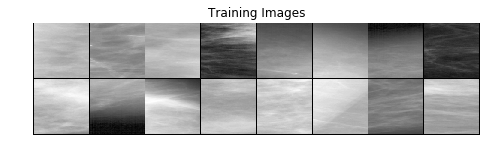

In [51]:
# Plot some training images
real_batch = next(iter(train_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:16], padding=2, normalize=True).cpu(),(1,2,0)))

In [52]:
mask_patch = real_batch[1]
np.place(mask_patch.numpy(),mask_patch.numpy()>-1, [1])
np.place(mask_patch.numpy(),mask_patch.numpy()==-1, [0])

In [53]:
print(torch.min(mask_patch))
print(torch.max(mask_patch))

tensor(0.)
tensor(1.)


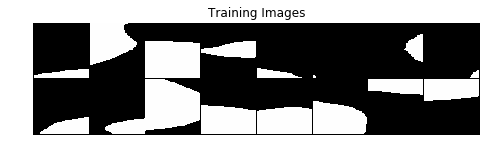

In [54]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(mask_patch.to(device)[:16], padding=2, normalize=True).cpu(),(1,2,0)))

In [63]:
def createpatch(mydata, masks, batch_size):
    real = Variable(mydata.data.clone())
    mask = Variable(masks.data.clone())
    realdata = real[:batch_size]
    maskdata = mask[:batch_size]
    
    ## find the mask location
    maskpos = np.where(maskdata==1)
    
    #create index file
    indices = np.empty((maskpos[0].shape[0], len(maskpos)))
    for i in range(maskpos[0].shape[0]):
    
        indices[i] = np.array((maskpos[0][i],maskpos[1][i],maskpos[2][i], maskpos[3][i]))
    
    
    
    #Get the min max index for rows and columns of all images and obtain the biggest sizes
    #print(indices[1])
    
    
    # transform real images to have a noise input
    
    for index in indices:
        realdata[int(index[0])][int(index[1])][int(index[2])][int(index[3])] = np.random.uniform(-1,1)
    
   
    
    return realdata

In [64]:
imgs = createpatch(real_batch[0], mask_patch, batch_size)

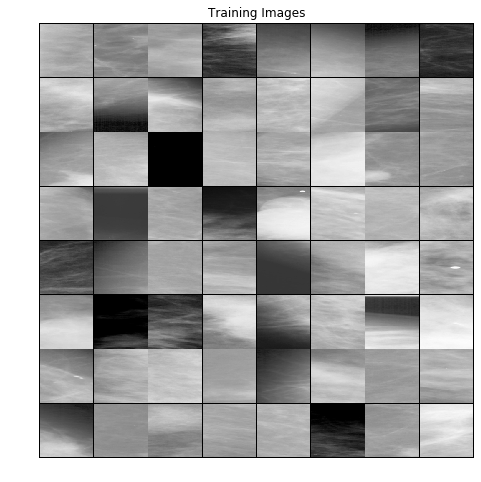

In [67]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

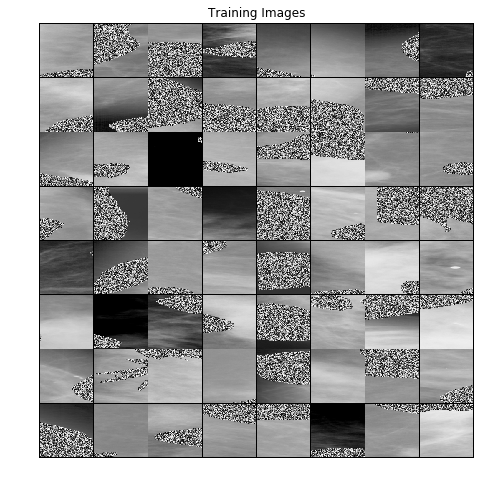

In [68]:
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(imgs.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))